In [1]:
import os
import time
from tqdm.notebook import trange
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import tensorflow as tf
from tensorflow.data import Dataset
from tensorflow.data.experimental import AUTOTUNE
from tensorflow.keras.utils import plot_model
from tensorflow.keras.models import Model
from tensorflow.keras.losses import BinaryCrossentropy, MeanSquaredError
from tensorflow.keras.metrics import Mean
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.initializers import TruncatedNormal
from tensorflow.train import Checkpoint, CheckpointManager
from tensorflow.keras.layers import Input, Dense, BatchNormalization, Conv2D, Conv2DTranspose, \
        LeakyReLU, SpatialDropout2D, Dropout, MaxPool2D, GlobalAvgPool2D, Concatenate

from IPython import display

print(tf.__version__)

2.3.0


In [2]:
tf.get_logger().setLevel('ERROR')

In [3]:
RANDOM_STATE = 7
SHUFFLE_BUFFER = 2_000
IMAGE_SIZE = (192, 160)
NOISE_STDDEV = 0.05
BATCH_SIZE = 16
PREDICT_COUNT = 10
LOG_DIR = "tb_logs/fit/Iteration_1"

In [4]:
GEN_LR = 5e-5
GEN_BETA_1 = 0.7
GEN_RELU_ALPHA = 0.2

AE_LR = 1e-6
AE_BETA_1 = 0.9
AE_RELU_ALPHA = 0.3

DISC_LR = 1e-5
DISC_BETA_1 = 0.9
DISC_RELU_ALPHA = 0.3
DISC_LABEL_SMOOTHING = 0.1

TRAIN_STEPS = 2_500
EPOCHS = 20
CE_LAMBDA = 3
MSE_LAMBDA = 25
AE_LAMBDA = 20
PLOTS_DPI = 100
CKPT_FREQ = 5
RETRAIN = os.path.isfile('./ckpt/checkpoint')

In [5]:
all_df = pd.read_csv("../../Dataset/list_attr_celeba.csv", usecols = ["image_id", "Male"])
all_df["filepath"] = "../../Dataset/img_align_celeba/" + all_df["image_id"]
all_df.head()

,image_id,Male,filepath
0,000001.jpg,-1,../../Dataset/img_align_celeba/000001.jpg
1,000002.jpg,-1,../../Dataset/img_align_celeba/000002.jpg
2,000003.jpg,1,../../Dataset/img_align_celeba/000003.jpg
3,000004.jpg,-1,../../Dataset/img_align_celeba/000004.jpg
4,000005.jpg,-1,../../Dataset/img_align_celeba/000005.jpg


In [6]:
all_df[["Male"]].value_counts()

Male
-1      118165
 1       84434
dtype: int64

In [7]:
female_df = all_df[all_df["Male"] == -1]
len(female_df)

118165

In [8]:
male_df = all_df[all_df["Male"] == 1]
len(male_df)

84434

In [9]:
def load_image_data(filename):
    img = tf.io.read_file(filename)
    img = tf.io.decode_jpeg(img, channels = 3)
    img = tf.image.resize(img, IMAGE_SIZE)
    return (img - 127.5)/127.5

def add_noise(image):
    noise = tf.random.normal(image.shape, mean = 0.0, stddev = NOISE_STDDEV)
    image = image + noise
    return tf.clip_by_value(image, -1, 1)

In [10]:
female_ds = Dataset.from_tensor_slices(female_df["filepath"]) \
        .cache() \
        .shuffle(SHUFFLE_BUFFER) \
        .map(load_image_data, num_parallel_calls = AUTOTUNE) \
        .batch(BATCH_SIZE, drop_remainder = True) \
        .prefetch(buffer_size = AUTOTUNE)

female_ds

<PrefetchDataset shapes: (16, 192, 160, 3), types: tf.float32>

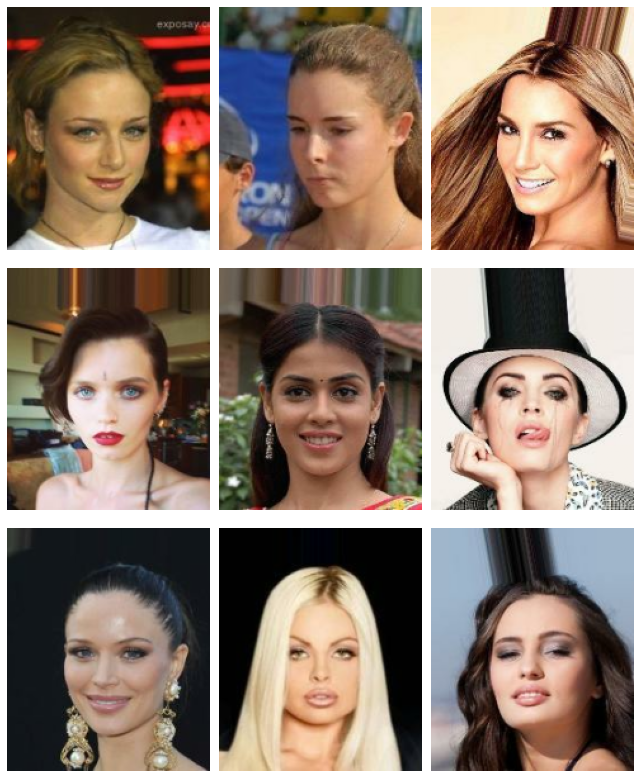

In [11]:
fig, axes = plt.subplots(nrows = 3, ncols = 3, figsize = (9, 11))

sample_images = [i for i in female_ds.take(1)][0].numpy()

for i, ax in enumerate(axes.flatten()):
    ax.imshow((sample_images[i] * 0.5) + 0.5)
    ax.axis(False)
    ax.grid(False)

plt.tight_layout()

In [12]:
male_ds = Dataset.from_tensor_slices(male_df["filepath"]) \
        .cache() \
        .shuffle(SHUFFLE_BUFFER) \
        .map(load_image_data, num_parallel_calls = AUTOTUNE) \
        .map(add_noise, num_parallel_calls = AUTOTUNE) \
        .batch(BATCH_SIZE, drop_remainder = True) \
        .prefetch(buffer_size = AUTOTUNE)

male_ds

<PrefetchDataset shapes: (16, 192, 160, 3), types: tf.float32>

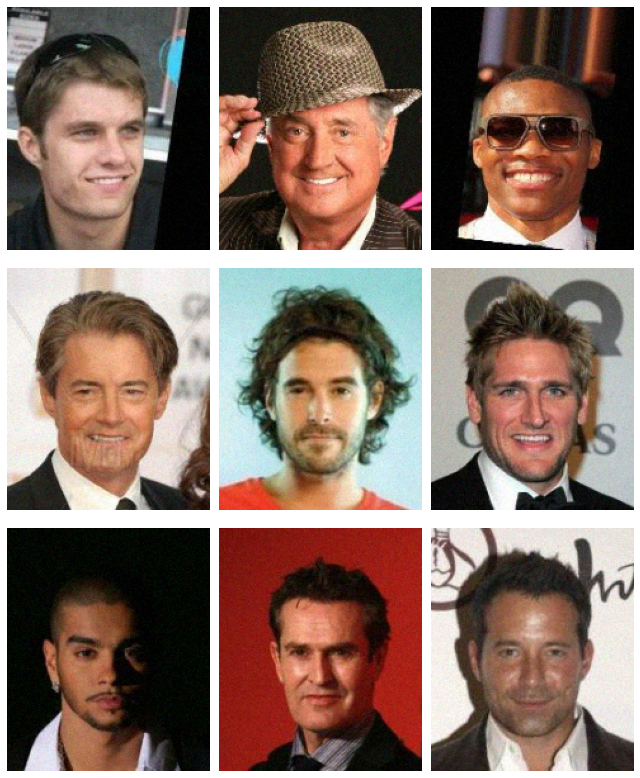

In [13]:
fig, axes = plt.subplots(nrows = 3, ncols = 3, figsize = (9, 11))

sample_images = list(map(add_noise, map(load_image_data, male_df.sample(PREDICT_COUNT, random_state = RANDOM_STATE)["filepath"].values)))
sample_images = np.array([i.numpy() for i in sample_images])

for i, ax in enumerate(axes.flatten()):
    ax.imshow((sample_images[i] * 0.5) + 0.5)
    ax.axis(False)
    ax.grid(False)

plt.tight_layout()

In [14]:
def generator_model():
    weight_init = TruncatedNormal(mean = 0.0, stddev = 0.02)

    input_layer = Input(shape = (*IMAGE_SIZE, 3), name = 'Gen_Input')


    conv_1 = Conv2D(64, 6, padding = 'same', activation = LeakyReLU(GEN_RELU_ALPHA), 
                    kernel_initializer = weight_init, name = 'Gen_Conv_1')(input_layer)
    pool_1 = MaxPool2D(name = 'Gen_MP_1')(conv_1)
    bn_1 = BatchNormalization(name = 'Gen_BN_1')(pool_1)
    conv_2 = Conv2D(128, 6, padding = 'same', activation = LeakyReLU(GEN_RELU_ALPHA), 
                    kernel_initializer = weight_init, name = 'Gen_Conv_2')(bn_1)
    pool_2 = MaxPool2D(name = 'Gen_MP_2')(conv_2)
    bn_2 = BatchNormalization(name = 'Gen_BN_2')(pool_2)
    spd_1 = SpatialDropout2D(0.2, name = 'Gen_SPD_1')(bn_2)
    

    conv_3 = Conv2D(256, 4, padding = 'same', activation = LeakyReLU(GEN_RELU_ALPHA), 
                    kernel_initializer = weight_init, name = 'Gen_Conv_3')(spd_1)
    pool_3 = MaxPool2D(name = 'Gen_MP_3')(conv_3)
    bn_3 = BatchNormalization(name = 'Gen_BN_3')(pool_3)
    conv_4 = Conv2D(512, 4, padding = 'same', activation = LeakyReLU(GEN_RELU_ALPHA), 
                    kernel_initializer = weight_init, name = 'Gen_Conv_4')(bn_3)
    pool_4 = MaxPool2D(name = 'Gen_MP_4')(conv_4)
    bn_4 = BatchNormalization(name = 'Gen_BN_4')(pool_4)
    spd_2 = SpatialDropout2D(0.2, name = 'Gen_SPD_2')(bn_4)
    

    conv_5 = Conv2D(1024, 2, padding = 'same', activation = LeakyReLU(GEN_RELU_ALPHA), 
                    kernel_initializer = weight_init, name = 'Gen_Conv_5')(spd_2)
    pool_5 = MaxPool2D(name = 'Gen_MP_5')(conv_5)
    bn_5 = BatchNormalization(name = 'Gen_BN_5')(pool_5)
    spd_3 = SpatialDropout2D(0.2, name = 'Gen_SPD_3')(bn_5)
    

    conv_t_1 = Conv2DTranspose(512, 2, padding = 'same', strides = 2, activation = LeakyReLU(GEN_RELU_ALPHA), 
                    kernel_initializer = weight_init, name = 'Gen_Conv_T_1')(spd_3)
    bn_6 = BatchNormalization(name = 'Gen_BN_6')(conv_t_1)
    concat_1 = Concatenate(name = 'Gen_Concat_1')([bn_6, bn_4])
    spd_4 = SpatialDropout2D(0.2, name = 'Gen_SPD_4')(concat_1)
    

    conv_t_2 = Conv2DTranspose(256, 4, padding = 'same', strides = 2, activation = LeakyReLU(GEN_RELU_ALPHA), 
                    kernel_initializer = weight_init, name = 'Gen_Conv_T_2')(spd_4)
    bn_7 = BatchNormalization(name = 'Gen_BN_7')(conv_t_2)
    concat_2 = Concatenate(name = 'Gen_Concat_2')([bn_7, bn_3])
    conv_t_3 = Conv2DTranspose(128, 4, padding = 'same', strides = 2, activation = LeakyReLU(GEN_RELU_ALPHA), 
                    kernel_initializer = weight_init, name = 'Gen_Conv_T_3')(concat_2)
    bn_8 = BatchNormalization(name = 'Gen_BN_8')(conv_t_3)
    concat_3 = Concatenate(name = 'Gen_Concat_3')([bn_8, bn_2])
    spd_5 = SpatialDropout2D(0.2, name = 'Gen_SPD_5')(concat_3)
    

    conv_t_4 = Conv2DTranspose(64, 6, padding = 'same', strides = 2, activation = LeakyReLU(GEN_RELU_ALPHA), 
                    kernel_initializer = weight_init, name = 'Gen_Conv_T_4')(spd_5)
    bn_9 = BatchNormalization(name = 'Gen_BN_9')(conv_t_4)
    concat_4 = Concatenate(name = 'Gen_Concat_4')([bn_9, bn_1])
    conv_t_5 = Conv2DTranspose(32, 6, padding = 'same', strides = 2, activation = LeakyReLU(GEN_RELU_ALPHA), 
                    kernel_initializer = weight_init, name = 'Gen_Conv_T_5')(concat_4)
    bn_10 = BatchNormalization(name = 'Gen_BN_10')(conv_t_5)

    conv_t_6 = Conv2DTranspose(3, 7, padding = 'same', activation = 'tanh', 
                    kernel_initializer = weight_init, name = 'Gen_Conv_T_6')(bn_10)
    
    return Model(inputs = input_layer, outputs = conv_t_6, name = 'Generator')
    
generator = generator_model()
generator.summary()

Model: "Generator"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Gen_Input (InputLayer)          [(None, 192, 160, 3) 0                                            
__________________________________________________________________________________________________
Gen_Conv_1 (Conv2D)             (None, 192, 160, 64) 6976        Gen_Input[0][0]                  
__________________________________________________________________________________________________
Gen_MP_1 (MaxPooling2D)         (None, 96, 80, 64)   0           Gen_Conv_1[0][0]                 
__________________________________________________________________________________________________
Gen_BN_1 (BatchNormalization)   (None, 96, 80, 64)   256         Gen_MP_1[0][0]                   
__________________________________________________________________________________________

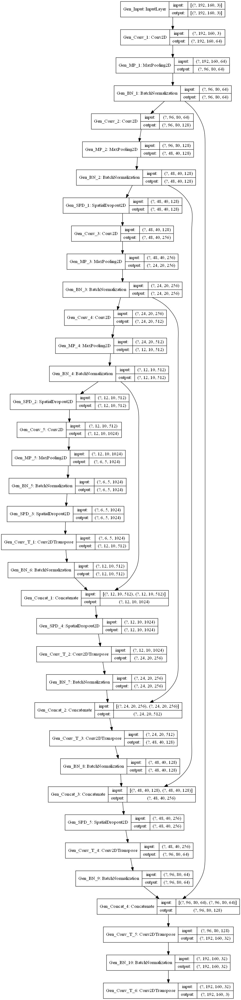

In [15]:
plot_model(generator, to_file = 'Generator.jpg', show_shapes = True, dpi = PLOTS_DPI)

In [16]:
def autoencoder_model():
    weight_init = TruncatedNormal(mean = 0.0, stddev = 0.02)

    input_layer = Input(shape = (*IMAGE_SIZE, 3), name = 'AE_Input')


    conv_1 = Conv2D(32, 6, padding = 'same', activation = LeakyReLU(AE_RELU_ALPHA), 
                    kernel_initializer = weight_init, name = 'AE_Conv_1')(input_layer)
    pool_1 = MaxPool2D(name = 'AE_MP_1')(conv_1)
    bn_1 = BatchNormalization(name = 'AE_BN_1')(pool_1)
    conv_2 = Conv2D(64, 6, padding = 'same', activation = LeakyReLU(AE_RELU_ALPHA), 
                    kernel_initializer = weight_init, name = 'AE_Conv_2')(bn_1)
    pool_2 = MaxPool2D(name = 'AE_MP_2')(conv_2)
    bn_2 = BatchNormalization(name = 'AE_BN_2')(pool_2)
    spd_1 = SpatialDropout2D(0.2, name = 'AE_SPD_1')(bn_2)
    

    conv_3 = Conv2D(128, 4, padding = 'same', activation = LeakyReLU(AE_RELU_ALPHA), 
                    kernel_initializer = weight_init, name = 'AE_Conv_3')(spd_1)
    pool_3 = MaxPool2D(name = 'AE_MP_3')(conv_3)
    bn_3 = BatchNormalization(name = 'AE_BN_3')(pool_3)
    conv_4 = Conv2D(256, 4, padding = 'same', activation = LeakyReLU(AE_RELU_ALPHA), 
                    kernel_initializer = weight_init, name = 'AE_Conv_4')(bn_3)
    pool_4 = MaxPool2D(name = 'AE_MP_4')(conv_4)
    bn_4 = BatchNormalization(name = 'AE_BN_4')(pool_4)
    spd_2 = SpatialDropout2D(0.2, name = 'AE_SPD_2')(bn_4)
    

    conv_5 = Conv2D(512, 2, padding = 'same', activation = LeakyReLU(AE_RELU_ALPHA), 
                    kernel_initializer = weight_init, name = 'AE_Conv_5')(spd_2)
    pool_5 = MaxPool2D(name = 'AE_MP_5')(conv_5)
    bn_5 = BatchNormalization(name = 'AE_BN_5')(pool_5)
    spd_3 = SpatialDropout2D(0.2, name = 'AE_SPD_3')(bn_5)
    

    conv_t_1 = Conv2DTranspose(256, 2, padding = 'same', strides = 2, activation = LeakyReLU(AE_RELU_ALPHA), 
                    kernel_initializer = weight_init, name = 'AE_Conv_T_1')(spd_3)
    bn_6 = BatchNormalization(name = 'AE_BN_6')(conv_t_1)
    concat_1 = Concatenate(name = 'AE_Concat_1')([bn_6, bn_4])
    spd_4 = SpatialDropout2D(0.2, name = 'AE_SPD_4')(concat_1)
    

    conv_t_2 = Conv2DTranspose(128, 4, padding = 'same', strides = 2, activation = LeakyReLU(AE_RELU_ALPHA), 
                    kernel_initializer = weight_init, name = 'AE_Conv_T_2')(spd_4)
    bn_7 = BatchNormalization(name = 'AE_BN_7')(conv_t_2)
    concat_2 = Concatenate(name = 'AE_Concat_2')([bn_7, bn_3])
    conv_t_3 = Conv2DTranspose(64, 4, padding = 'same', strides = 2, activation = LeakyReLU(AE_RELU_ALPHA), 
                    kernel_initializer = weight_init, name = 'AE_Conv_T_3')(concat_2)
    bn_8 = BatchNormalization(name = 'AE_BN_8')(conv_t_3)
    concat_3 = Concatenate(name = 'AE_Concat_3')([bn_8, bn_2])
    spd_5 = SpatialDropout2D(0.2, name = 'AE_SPD_5')(concat_3)
    

    conv_t_4 = Conv2DTranspose(32, 6, padding = 'same', strides = 2, activation = LeakyReLU(AE_RELU_ALPHA), 
                    kernel_initializer = weight_init, name = 'AE_Conv_T_4')(spd_5)
    bn_9 = BatchNormalization(name = 'AE_BN_9')(conv_t_4)
    concat_4 = Concatenate(name = 'AE_Concat_4')([bn_9, bn_1])
    conv_t_5 = Conv2DTranspose(16, 6, padding = 'same', strides = 2, activation = LeakyReLU(AE_RELU_ALPHA), 
                    kernel_initializer = weight_init, name = 'AE_Conv_T_5')(concat_4)
    bn_10 = BatchNormalization(name = 'AE_BN_10')(conv_t_5)

    conv_t_6 = Conv2DTranspose(3, 7, padding = 'same', activation = 'tanh', 
                    kernel_initializer = weight_init, name = 'AE_Conv_T_6')(bn_10)
    
    return Model(inputs = input_layer, outputs = conv_t_6, name = 'Autoencoder')
    
autoencoder = autoencoder_model()
autoencoder.summary()

Model: "Autoencoder"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
AE_Input (InputLayer)           [(None, 192, 160, 3) 0                                            
__________________________________________________________________________________________________
AE_Conv_1 (Conv2D)              (None, 192, 160, 32) 3488        AE_Input[0][0]                   
__________________________________________________________________________________________________
AE_MP_1 (MaxPooling2D)          (None, 96, 80, 32)   0           AE_Conv_1[0][0]                  
__________________________________________________________________________________________________
AE_BN_1 (BatchNormalization)    (None, 96, 80, 32)   128         AE_MP_1[0][0]                    
________________________________________________________________________________________

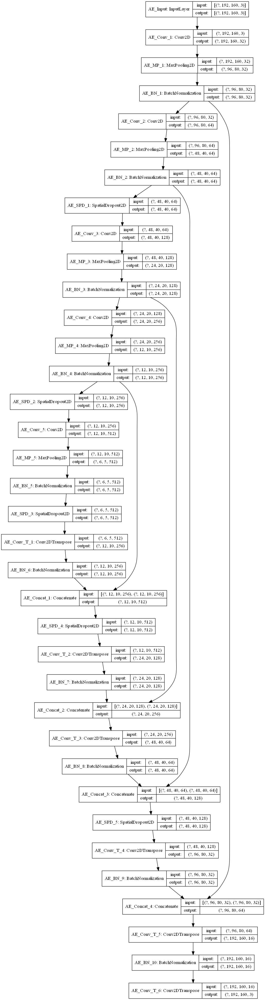

In [17]:
plot_model(autoencoder, to_file = 'Autoencoder.jpg', show_shapes = True, dpi = PLOTS_DPI)

In [18]:
def discriminator_model():
    input_layer = Input(shape = (*IMAGE_SIZE, 3), name = 'Disc_Input')
    
    conv_1 = Conv2D(32, (4, 4), activation = LeakyReLU(DISC_RELU_ALPHA), padding = 'same', name = 'Disc_Conv_1')(input_layer)
    max_pool_1 = MaxPool2D(2, name = 'Disc_MP_1')(conv_1)
    conv_2 = Conv2D(64, (4, 4), activation = LeakyReLU(DISC_RELU_ALPHA), padding = 'same', name = 'Disc_Conv_2')(max_pool_1)
    max_pool_2 = MaxPool2D(2, name = 'Disc_MP_2')(conv_2)
    global_pool_1 = GlobalAvgPool2D(name = 'Disc_GAP_1')(max_pool_2)
    
    sp_dropout_1 = SpatialDropout2D(0.2, name = 'Disc_SD_1')(max_pool_2)
    conv_3 = Conv2D(128, (3, 3), activation = LeakyReLU(DISC_RELU_ALPHA), padding = 'same', name = 'Disc_Conv_3')(sp_dropout_1)
    max_pool_3 = MaxPool2D(2, name = 'Disc_MP_3')(conv_3)
    conv_4 = Conv2D(256, (3, 3), activation = LeakyReLU(DISC_RELU_ALPHA), padding = 'same', name = 'Disc_Conv_4')(max_pool_3)
    max_pool_4 = MaxPool2D(2, name = 'Disc_MP_4')(conv_4)
    global_pool_2 = GlobalAvgPool2D(name = 'Disc_GAP_2')(max_pool_4)
    
    sp_dropout_2 = SpatialDropout2D(0.2, name = 'Disc_SD_2')(max_pool_4)
    conv_5 = Conv2D(512, (2, 2), activation = LeakyReLU(DISC_RELU_ALPHA), padding = 'same', name = 'Disc_Conv_5')(sp_dropout_2)
    max_pool_5 = MaxPool2D(2, name = 'Disc_MP_5')(conv_5)
    global_pool_3 = GlobalAvgPool2D(name = 'Disc_GAP_3')(max_pool_5)
    
    concat = Concatenate(name = 'Disc_Concat')([global_pool_1, global_pool_2, global_pool_3])
    dropout = Dropout(0.2, name = 'Disc_Dropout')(concat)
    dense_1 = Dense(32, activation = LeakyReLU(DISC_RELU_ALPHA), name = 'Disc_Dense_1')(dropout)
    dense_2 = Dense(1, name = 'Disc_Dense_2')(dense_1)
    
    return Model(inputs = input_layer, outputs = dense_2, name = 'Discriminator')
    
discriminator = discriminator_model()
discriminator.summary()

Model: "Discriminator"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Disc_Input (InputLayer)         [(None, 192, 160, 3) 0                                            
__________________________________________________________________________________________________
Disc_Conv_1 (Conv2D)            (None, 192, 160, 32) 1568        Disc_Input[0][0]                 
__________________________________________________________________________________________________
Disc_MP_1 (MaxPooling2D)        (None, 96, 80, 32)   0           Disc_Conv_1[0][0]                
__________________________________________________________________________________________________
Disc_Conv_2 (Conv2D)            (None, 96, 80, 64)   32832       Disc_MP_1[0][0]                  
______________________________________________________________________________________

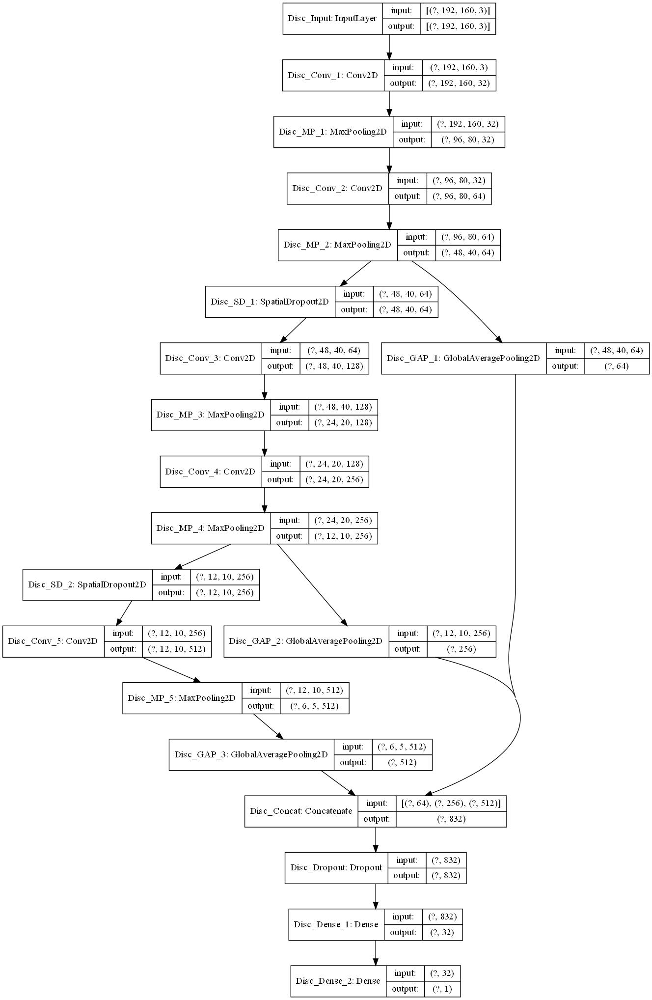

In [19]:
plot_model(discriminator, to_file = 'Discriminator.jpg', show_shapes = True, dpi = PLOTS_DPI)

In [20]:
cross_entropy = BinaryCrossentropy(from_logits = True)
mse_loss = MeanSquaredError()

gen_mean_loss = Mean(name = "Generator mean total loss")
gen_mean_mse_loss = Mean(name = "Generator mean MSE loss")
gen_mean_ce_loss = Mean(name = "Generator mean entropy loss")

disc_mean_loss = Mean(name = "Discriminator mean total loss")
disc_mean_mse_loss = Mean(name = "Discriminator mean MSE loss")
disc_mean_ce_loss = Mean(name = "Discriminator mean entropy loss")

ae_mean_loss = Mean(name = "Autoencoder mean loss")

generator_optimizer = Adam(GEN_LR, beta_1 = GEN_BETA_1)
discriminator_optimizer = Adam(DISC_LR, beta_1 = DISC_BETA_1)
ae_optimizer = Adam(AE_LR, AE_BETA_1)

In [21]:
summary_writer = tf.summary.create_file_writer(LOG_DIR)
summary_writer

In [22]:
checkpoint_dir = './ckpt'

checkpoint = Checkpoint(
    step = tf.Variable(1),
    generator_optimizer = generator_optimizer,
    ae_optimizer = ae_optimizer,
    discriminator_optimizer = discriminator_optimizer,
    generator = generator,
    autoencoder = autoencoder,
    discriminator = discriminator)

ckpt_manager = CheckpointManager(checkpoint, checkpoint_dir, max_to_keep = 5)

EPOCH_START = 1
if RETRAIN:
    checkpoint.restore(ckpt_manager.latest_checkpoint)
    EPOCH_START = checkpoint.step.numpy()

print(f"Starting training from Epoch {EPOCH_START}")

Starting training from Epoch 81


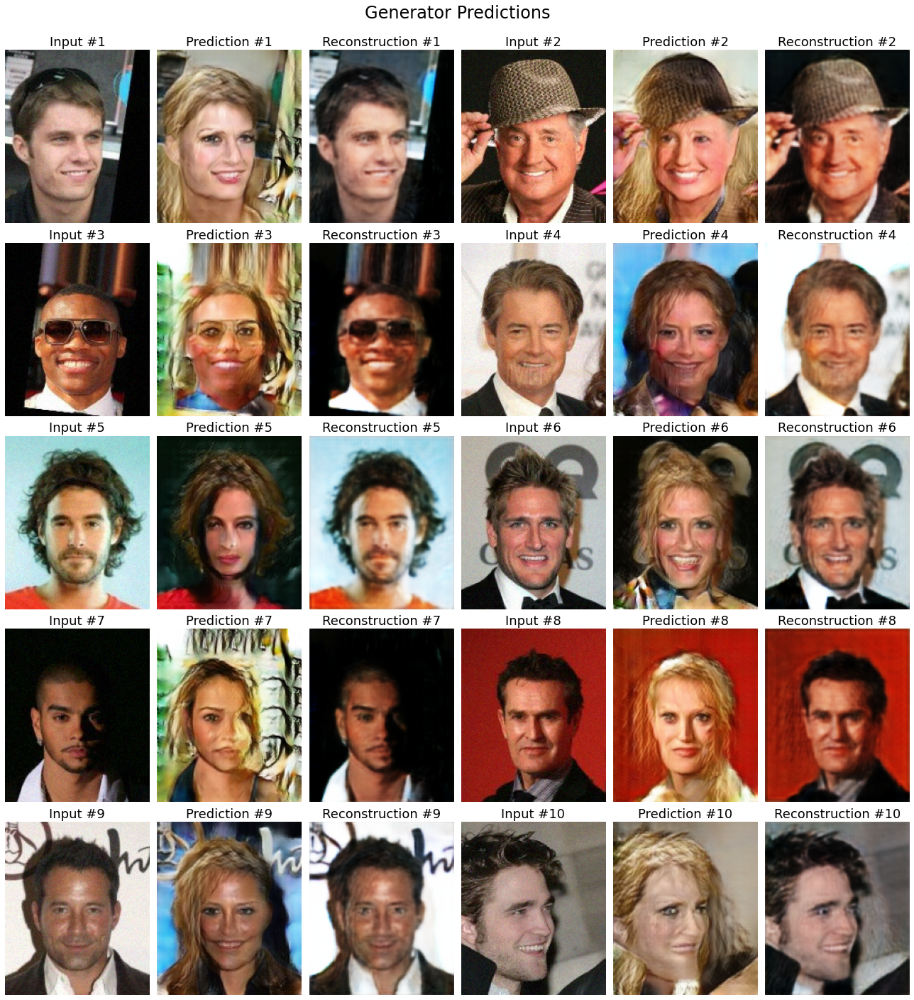

In [23]:
def generate_images(save = False, epoch = None, return_images = False):
    pred = generator(sample_images, training = False)
    reconstruction = autoencoder(pred, training = False)

    _, axes = plt.subplots(nrows = 5, ncols = 6, figsize = (18, 20))

    for i, ax in enumerate(axes.flatten()):
        if i % 3 == 0:
            ax.imshow((sample_images[(i // 3)] * 0.5) + 0.5)
            ax.set_title(f"Input #{(i // 3) + 1}", fontsize = 18)
        elif i % 3 == 1:
            ax.imshow((pred[(i // 3)] * 0.5) + 0.5)
            ax.set_title(f"Prediction #{(i // 3) + 1}", fontsize = 18)
        else:
            ax.imshow((reconstruction[(i // 3)] * 0.5) + 0.5)
            ax.set_title(f"Reconstruction #{(i // 3) + 1}", fontsize = 18)

        ax.axis(False)
        ax.grid(False)

    plt.suptitle('Generator Predictions', fontsize = 24)
    
    plt.tight_layout(rect = [0, 0, 1, 0.98])

    if save:
        plt.savefig(f'Outputs/Pred_Epoch_{epoch:04d}.png', dpi = PLOTS_DPI, facecolor = 'white', 
                transparent = False, bbox_inches = 'tight')
        plt.close()
    
    if return_images:
        return ((pred * 0.5) + 0.5, (reconstruction * 0.5) + 0.5)

generate_images()

In [24]:
discriminator(generator(sample_images, training = False), training = False).numpy()

array([[0.49867323],
       [0.48976737],
       [0.49948445],
       [0.49480468],
       [0.49056715],
       [0.49443558],
       [0.5047241 ],
       [0.48326603],
       [0.48782644],
       [0.492957  ]], dtype=float32)

In [25]:
def discriminator_loss(female_output, gen_output):
    female_labels = tf.ones_like(female_output) - (tf.random.uniform(female_output.shape) * DISC_LABEL_SMOOTHING)
    gen_labels = tf.zeros_like(gen_output) + (tf.random.uniform(gen_output.shape) * DISC_LABEL_SMOOTHING)

    female_mse_loss = mse_loss(female_labels, female_output)
    gen_mse_loss = mse_loss(gen_labels, gen_output)
    total_mse_loss = female_mse_loss + gen_mse_loss

    female_ce_loss = cross_entropy(female_labels, female_output)
    gen_ce_loss = cross_entropy(gen_labels, gen_output)
    total_ce_loss = female_ce_loss + gen_ce_loss

    return (total_mse_loss, total_ce_loss)

def autoencoder_loss(original_input, reconstructed_output):
    return mse_loss(original_input, reconstructed_output)

def generator_loss(gen_output):
    labels = tf.ones_like(gen_output)
    return (mse_loss(labels, gen_output), cross_entropy(labels, gen_output))

In [26]:
@tf.function
def train_step(female_images, male_images):

    with tf.GradientTape() as gen_tape, tf.GradientTape() as ae_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(male_images, training = True)
        reconstructed_images = autoencoder(generated_images, training = True)

        female_output = discriminator(female_images, training = True)
        gen_output = discriminator(generated_images, training = True)

        gen_mse_loss, gen_ce_loss = generator_loss(gen_output)
        ae_loss = autoencoder_loss(male_images, reconstructed_images)
        disc_mse_loss, disc_ce_loss = discriminator_loss(female_output, gen_output)

        gen_total_loss = (MSE_LAMBDA * gen_mse_loss) + (CE_LAMBDA * gen_ce_loss) + (AE_LAMBDA * ae_loss)
        disc_total_loss = (MSE_LAMBDA * disc_mse_loss) + (CE_LAMBDA * disc_ce_loss)

    gen_mean_loss(gen_total_loss)
    gen_mean_mse_loss(gen_mse_loss)
    gen_mean_ce_loss(gen_ce_loss)

    ae_mean_loss(AE_LAMBDA * ae_loss)

    disc_mean_loss(disc_total_loss)
    disc_mean_mse_loss(disc_mse_loss)
    disc_mean_ce_loss(disc_ce_loss)

    gradients_of_generator = gen_tape.gradient(gen_total_loss, generator.trainable_variables)
    gradients_of_autoencoder = ae_tape.gradient(ae_loss, autoencoder.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_total_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    ae_optimizer.apply_gradients(zip(gradients_of_autoencoder, autoencoder.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

In [27]:
gen_losses = []
ae_losses = []
disc_losses = []

def train(female_ds, male_ds, epochs):
    for epoch in range(epochs):
        start = time.time()

        female_ds_iter = iter(female_ds)
        male_ds_iter = iter(male_ds)
        
        gen_mean_loss.reset_states()
        gen_mean_mse_loss.reset_states()
        gen_mean_ce_loss.reset_states()

        ae_mean_loss.reset_states()

        disc_mean_loss.reset_states()
        disc_mean_mse_loss.reset_states()
        disc_mean_ce_loss.reset_states()

        print(f"\nTraining Epoch {epoch + EPOCH_START}\n")
        
        for _ in trange(TRAIN_STEPS, desc = f"Training Epoch {epoch + EPOCH_START}"):
            train_step(next(female_ds_iter), next(male_ds_iter))
        
        checkpoint.step.assign_add(1)

        display.clear_output(wait = True)
        
        pred_images, reconstructed_images = generate_images(True, epoch + EPOCH_START, True)

        if (epoch + EPOCH_START) % CKPT_FREQ == 0:
            ckpt_manager.save()
            
        gen_losses.append(gen_mean_loss.result())
        ae_losses.append(ae_mean_loss.result())
        disc_losses.append(disc_mean_loss.result())

        print(f"\nEpoch: {epoch + EPOCH_START}\n")

        print(f'Generator MSE Loss: {gen_mean_mse_loss.result():.4f}')
        print(f'Generator Entropy Loss: {gen_mean_ce_loss.result():.4f}')
        print(f'Generator Total Loss: {gen_mean_loss.result():.4f}\n')

        print(f'Autoencoder Loss: {ae_mean_loss.result():.4f}\n')

        print(f'Discriminator MSE Loss: {disc_mean_mse_loss.result():.4f}')
        print(f'Discriminator Entropy Loss: {disc_mean_ce_loss.result():.4f}')
        print(f'Discriminator Total Loss: {disc_mean_loss.result():.4f}\n')

        print (f'Time elapsed: {time.time() - start:.2f} s')

        with summary_writer.as_default():
            tf.summary.scalar("Generator_MSE_Loss", gen_mean_mse_loss.result(), step = epoch + EPOCH_START)
            tf.summary.scalar("Generator_Entropy_Loss", gen_mean_ce_loss.result(), step = epoch + EPOCH_START)
            tf.summary.scalar("Generator_Total_Loss", gen_mean_loss.result(), step = epoch + EPOCH_START)
            tf.summary.scalar("Autoencoder_Loss", ae_mean_loss.result(), step = epoch + EPOCH_START) 
            tf.summary.scalar("Discriminator_MSE_Loss", disc_mean_mse_loss.result(), step = epoch + EPOCH_START)
            tf.summary.scalar("Discriminator_Entropy_Loss", disc_mean_ce_loss.result(), step = epoch + EPOCH_START)
            tf.summary.scalar("Discriminator_Total_Loss", disc_mean_loss.result(), step = epoch + EPOCH_START) 
            tf.summary.image("Generator_Predictions", pred_images, step = epoch + EPOCH_START, max_outputs = PREDICT_COUNT)
            tf.summary.image("Autoencoder_Reconstructions", reconstructed_images, step = epoch + EPOCH_START, max_outputs = PREDICT_COUNT)

    display.clear_output(wait = True)

In [28]:
%%time

train(female_ds, male_ds, EPOCHS)

print(f'Final Generator MSE Loss: {gen_mean_mse_loss.result():.4f}')
print(f'Final Generator Entropy Loss: {gen_mean_ce_loss.result():.4f}')
print(f'Final Generator Total Loss: {gen_mean_loss.result():.4f}\n')

print(f'Final Autoencoder Loss: {ae_mean_loss.result():.4f}\n') 

print(f'Final Discriminator MSE Loss: {disc_mean_mse_loss.result():.4f}')
print(f'Final Discriminator Entropy Loss: {disc_mean_ce_loss.result():.4f}')
print(f'Final Discriminator Total Loss: {disc_mean_loss.result():.4f}\n')

Final Generator MSE Loss: 0.2586
Final Generator Entropy Loss: 0.4772
Final Generator Total Loss: 8.1852

Final Autoencoder Loss: 0.2895

Final Discriminator MSE Loss: 0.4056
Final Discriminator Entropy Loss: 1.4459
Final Discriminator Total Loss: 14.4776

Wall time: 9h 48min 18s


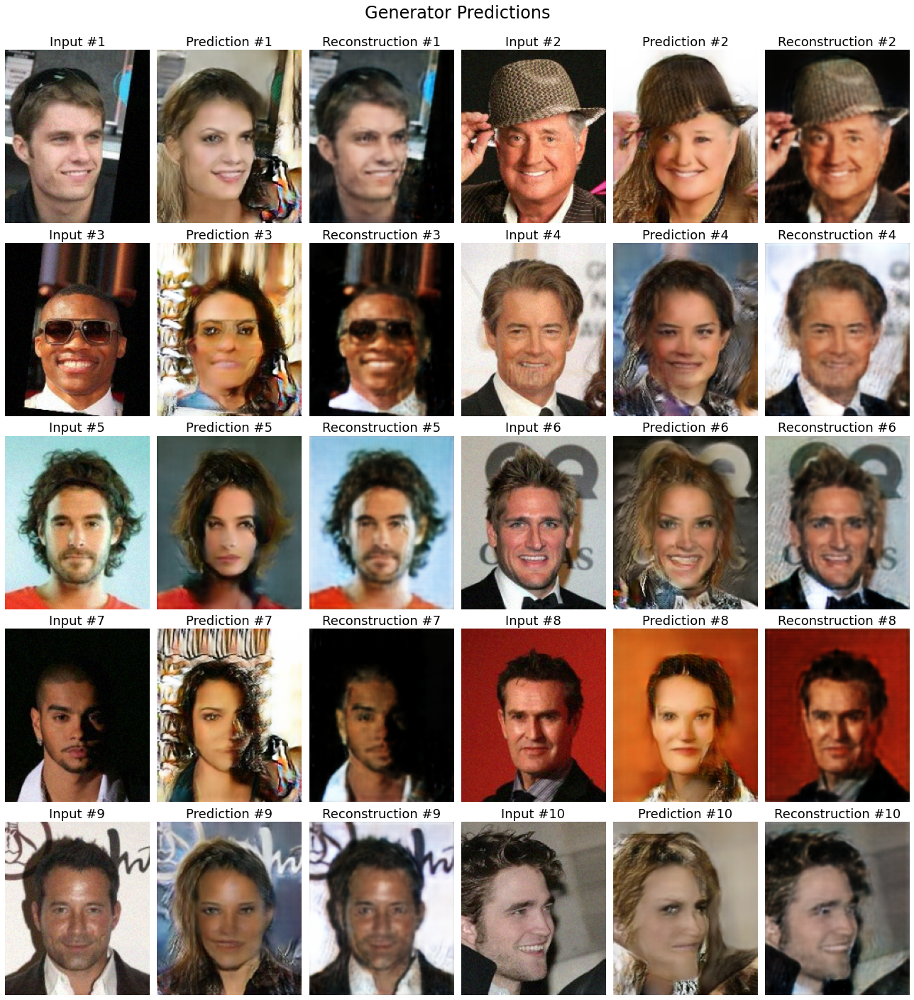

In [29]:
generate_images()

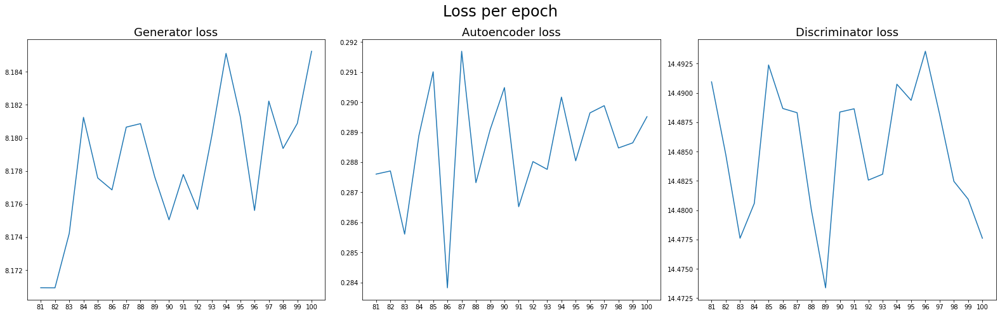

In [30]:
epoch_range = range(EPOCH_START, EPOCHS + EPOCH_START)
plt.figure(figsize = (22, 7))

plt.subplot(1, 3, 1)
plt.plot(epoch_range, gen_losses)
plt.xticks(epoch_range)
plt.title('Generator loss', fontsize = 18)

plt.subplot(1, 3, 2)
plt.plot(epoch_range, ae_losses)
plt.xticks(epoch_range)
plt.title('Autoencoder loss', fontsize = 18)

plt.subplot(1, 3, 3)
plt.plot(epoch_range, disc_losses)
plt.xticks(epoch_range)
plt.title('Discriminator loss', fontsize = 18)

plt.suptitle('Loss per epoch', fontsize = 24)
plt.tight_layout()
plt.show()

In [31]:
generator.save("generator")
autoencoder.save("autoencoder")
discriminator.save("discriminator")